this code sets up for making a map of the usa's covid cases by state along with importing everything needed for it

In [1]:
#COVID19Map.py
### import all modules that we will use in this lesson
import geopandas
import numpy as np
import pandas as pd
# We won't actually use datetime directly. Since the dataframe index will use 
# data formatted as datetime64, I import it in case I need to use the datetime
# module to troubleshoot later 
import datetime
# you could technically call many of the submodules from matplotlib using mpl., 
#but for convenience we explicitly import submodules. These will be used for 
# constructing visualizations
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm
# If you choose to make a dynamic visualization for the homework
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.ticker as mtick
import datadotworld as dw

def import_covid_data(filename, FIPS_name):
    # Load COVID19 county data using datadotworld API
    # Data provided by Johns Hopkins, file provided by Associated Press
    dataset = dw.load_dataset("associatedpress/johns-hopkins-coronavirus-case-tracker",
                              auto_update = True)
    # the dataset includes multiple dataframes. We will only use #2
    covid_data = dataset.dataframes[
        "2_cases_and_deaths_by_county_timeseries"]
    # Include only oberservation for political entities within states
    # i.e., not territories, etc... drop any nan fip values with covid_data[FIPS_name] > 0
    covid_data = covid_data[covid_data[FIPS_name] < 57000]
    covid_data = covid_data[covid_data[FIPS_name] > 0]
    # Transform FIPS codes into integers (not floats)
    covid_data[FIPS_name] = covid_data[FIPS_name].astype(int)
    covid_data.set_index([FIPS_name, "date"], inplace = True)
    # Prepare a column for state abbreviations. We will draw these from a
    # dictionary created in the next step.
    covid_data["state_abr"] = ""
    for state, abr in state_dict.items():
        covid_data.loc[covid_data["state"] == state, "state_abr"] = abr
    # Create "Location" which concatenates county name
    # and state abbreviation 
    covid_data["Location"] = covid_data["location_name"] + ", " + \
        covid_data["state_abr"]

    return covid_data


def import_geo_data(filename, index_col = "Date", FIPS_name = "FIPS"):
    # import county level shapefile
    map_data = geopandas.read_file(filename = filename,                                   
                                   index_col = index_col)
    # rename fips code to match variable name in COVID-19 data
    map_data.rename(columns={"State":"state"},
                    inplace = True)
    # Combine statefips and county fips to create a single fips value
    # that identifies each particular county without referencing the 
    # state separately
    map_data[FIPS_name] = map_data["STATEFP"].astype(str) + \
        map_data["COUNTYFP"].astype(str)
    map_data[FIPS_name] = map_data[FIPS_name].astype(np.int64)
    # set FIPS as index
    map_data.set_index(FIPS_name, inplace=True)
    
    return map_data

# I include this dictionary to convenienlty cross reference state names and
# state abbreviations.
state_dict = {    
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ',
    'Arkansas': 'AR', 'California': 'CA', 'Colorado': 'CO', 'Connecticut': 'CT', 
    'Delaware': 'DE', 'District of Columbia': 'DC', 'Florida': 'FL', 
    'Georgia': 'GA', 'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL',
    'Indiana': 'IN', 'Iowa': 'IA','Kansas': 'KS', 'Kentucky': 'KY',
    'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD', 'Massachusetts': 'MA',
    'Michigan': 'MI', 'Minnesota': 'MN', 'Mississippi': 'MS', 'Missouri': 'MO',
    'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 'New Hampshire': 'NH',
    'New Jersey': 'NJ', 'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC',
    'North Dakota': 'ND', 'Ohio': 'OH', 'Oklahoma': 'OK',
    'Oregon': 'OR', 'Pennsylvania': 'PA', 'Rhode Island': 'RI',
    'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN', 'Texas': 'TX',
    'Utah': 'UT', 'Vermont': 'VT', 'Virginia': 'VA',
    'Washington': 'WA', 'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY'}


names functions and tells the program what things are supposed to be

In [2]:
fips_name = "fips_code"
covid_filename = "COVID19DataAP.csv"
# rename_FIPS matches map_data FIPS with COVID19 FIPS name
map_data = import_geo_data(filename = "countiesWithStatesAndPopulation.shp",
                    index_col = "Date", FIPS_name= fips_name)
covid_data = import_covid_data(filename = covid_filename, FIPS_name = fips_name)

/Users/shoo/opt/anaconda3/lib/python3.7/site-packages/datadotworld/models/dataset.py:209: UserWarning: Unable to set data frame dtypes automatically using 2_cases_and_deaths_by_county_timeseries schema. Data types may need to be adjusted manually. Error: Integer column has NA values in column 2
  'Error: {}'.format(resource_name, e))


prints a map of the population of the usa

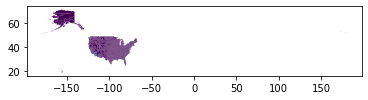

In [3]:
map_data.plot(column = "Population")

shows map data

In [4]:
map_data

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,state,geometry
fips_code,,,,,,,,,,,
21007,21,007,00516850,0500000US21007,Ballard,06,639387454,69473325,7888.0,Kentucky,"POLYGON ((-89.18137 37.04630, -89.17938 37.053..."
21017,21,017,00516855,0500000US21017,Bourbon,06,750439351,4829777,19788.0,Kentucky,"POLYGON ((-84.44266 38.28324, -84.44114 38.283..."
21031,21,031,00516862,0500000US21031,Butler,06,1103571974,13943044,12879.0,Kentucky,"POLYGON ((-86.94486 37.07341, -86.94346 37.074..."
21065,21,065,00516879,0500000US21065,Estill,06,655509930,6516335,14106.0,Kentucky,"POLYGON ((-84.12662 37.64540, -84.12483 37.646..."
21069,21,069,00516881,0500000US21069,Fleming,06,902727151,7182793,14581.0,Kentucky,"POLYGON ((-83.98428 38.44549, -83.98246 38.450..."
21093,21,093,00516893,0500000US21093,Hardin,06,1614569777,17463238,110958.0,Kentucky,"POLYGON ((-86.27756 37.58881, -86.27420 37.589..."
21099,21,099,00516896,0500000US21099,Hart,06,1068530028,13692536,19035.0,Kentucky,"POLYGON ((-86.16112 37.35080, -86.15845 37.351..."
21131,21,131,00516912,0500000US21131,Leslie,06,1038206077,9189732,9877.0,Kentucky,"POLYGON ((-83.55310 37.07928, -83.53528 37.103..."
21151,21,151,00516919,0500000US21151,Madison,06,1132729653,15306635,92987.0,Kentucky,"POLYGON ((-84.52564 37.76950, -84.52350 37.771..."


shows covid data

In [5]:
covid_data

uid location_type location_name    state  \
fips_code date                                                        
1001      2020-01-22  84001001        county       Autauga  Alabama   
          2020-01-23  84001001        county       Autauga  Alabama   
          2020-01-24  84001001        county       Autauga  Alabama   
          2020-01-25  84001001        county       Autauga  Alabama   
          2020-01-26  84001001        county       Autauga  Alabama   
          2020-01-27  84001001        county       Autauga  Alabama   
          2020-01-28  84001001        county       Autauga  Alabama   
          2020-01-29  84001001        county       Autauga  Alabama   
          2020-01-30  84001001        county       Autauga  Alabama   
          2020-01-31  84001001        county       Autauga  Alabama   
          2020-02-01  84001001        county       Autauga  Alabama   
          2020-02-02  84001001        county       Autauga  Alabama   
          2020-02-03  84001001        county       Autauga  Alabama   
          2020-02-04  84001001        county       Autauga  Alabama   
          2020-02-05  84001001        county       Autauga  Alabama   
          2020-02-06  84001001        county       Autauga  Alabama   
          2020-02-07  84001001        county       Autauga  Alabama   
          2020-02-08  84001001        county       Autauga  Alabama   
          2020-02-09  84001001        county       Autauga  Alabama   
          2020-02-10  84001001        county       Autauga  Alabama   
          2020-02-11  84001001        county       Autauga  Alabama   
          2020-02-12  84001001        county       Autauga  Alabama   
          2020-02-13  84001001        county       Autauga  Alabama   
          2020-02-14  84001001        county       Autauga  Alabama   
          2020-02-15  84001001        county       Autauga  Alabama   
          2020-02-16  84001001        county       Autauga  Alabama   
          2020-02-17  84001001        county       Autauga  Alabama   
          2020-02-18  84001001        county       Autauga  Alabama   
          2020-02-19  84001001        county       Autauga  Alabama   
          2020-02-20  84001001        county       Autauga  Alabama   
...                        ...           ...           ...      ...   
56045     2020-11-03  84056045        county        Weston  Wyoming   
          2020-11-04  84056045        county        Weston  Wyoming   
          2020-11-05  84056045        county        Weston  Wyoming   
          2020-11-06  84056045        county        Weston  Wyoming   
          2020-11-07  84056045        county        Weston  Wyoming   
          2020-11-08  84056045        county        Weston  Wyoming   
          2020-11-09  84056045        county        Weston  Wyoming   
          2020-11-10  84056045        county        Weston  Wyoming   
          2020-11-11  84056045        county        Weston  Wyoming   
          2020-11-12  84056045        county        Weston  Wyoming   
          2020-11-13  84056045        county        Weston  Wyoming   
          2020-11-14  84056045        county        Weston  Wyoming   
          2020-11-15  84056045        county        Weston  Wyoming   
          2020-11-16  84056045        county        Weston  Wyoming   
          2020-11-17  84056045        county        Weston  Wyoming   
          2020-11-18  84056045        county        Weston  Wyoming   
          2020-11-19  84056045        county        Weston  Wyoming   
          2020-11-20  84056045        county        Weston  Wyoming   
          2020-11-21  84056045        county        Weston  Wyoming   
          2020-11-22  84056045        county        Weston  Wyoming   
          2020-11-23  84056045        county        Weston  Wyoming   
          2020-11-24  84056045        county        Weston  Wyoming   
          2020-11-25  84056045        county        Weston  Wyoming   
          2020-11-26  84056045        county       

defines covid geo datafram and sets up for it with for loops

In [6]:
#COVID19Map.py
# . . .
def create_covid_geo_dataframe(covid_data, map_data, dates):
    # create geopandas dataframe with multiindex for date
    # original geopandas dataframe had no dates, so copies of the df are 
    # stacked vertically, with a new copy for each date in the covid_data index
    #(dates is a global)
    i = 0
    for date in dates:
        # select county observations from each date in dates
        df = covid_data[covid_data.index.get_level_values("date")==date]
        # use the fips_codes from the slice of covid_data to select counties
        # from the map_data index,making sure that the map_data index matches
        # the covid_data index
        counties = df.index.get_level_values("fips_code")
        # call a slice of the geodataframe that includes the counties 
        # that are in covid_data
        agg_df = map_data.loc[counties]
        # each row should reflect the date so that it is aligned 
        # with covid_data
        agg_df["date"] = date
        if i == 0:
            # create the geodataframe, select coordinate system (.crs) to
            # match map_data.crs
            matching_gpd = geopandas.GeoDataFrame(agg_df, crs = map_data.crs)
            i += 1
        else:
            # after initial geodataframe is created, stack a dataframe for
            # each date in dates. Once completed, index of matching_gpd
            # will match index of covid_data
            matching_gpd = matching_gpd.append(agg_df, ignore_index = False)         
    # Set mathcing_gpd index as["fips_code", "date"], liked covid_data index
    matching_gpd.reset_index(inplace=True)
    matching_gpd.set_index(["fips_code","date"], inplace = True)
    # add each column from covid_data to mathcing_gpd
    for key, val in covid_data.items():
        matching_gpd[key] = val
    return matching_gpd       

# . . . to end of script . . .
# dates will be used to create a geopandas DataFrame with multiindex 
dates = sorted(list(set(covid_data.index.get_level_values("date"))))
covid_data = create_covid_geo_dataframe(covid_data, map_data, dates)

shows more data on covid

In [7]:
covid_data

,,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,state,...,cumulative_deaths,cumulative_deaths_per_100_000,new_cases,new_deaths,new_cases_per_100_000,new_deaths_per_100_000,new_cases_7_day_rolling_avg,new_deaths_7_day_rolling_avg,state_abr,Location
fips_code,date,,,,,,,,,,,,,,,,,,,,,
1001,2020-01-22,1,001,00161526,0500000US01001,Autauga,06,1539602123,25706961,55869.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Autauga, AL"
1003,2020-01-22,1,003,00161527,0500000US01003,Baldwin,06,4117546676,1133055836,223234.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Baldwin, AL"
1005,2020-01-22,1,005,00161528,0500000US01005,Barbour,06,2292144655,50538698,24686.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Barbour, AL"
1007,2020-01-22,1,007,00161529,0500000US01007,Bibb,06,1612167481,9602089,22394.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Bibb, AL"
1009,2020-01-22,1,009,00161530,0500000US01009,Blount,06,1670103911,15015423,57826.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Blount, AL"
1011,2020-01-22,1,011,00161531,0500000US01011,Bullock,06,1613059160,6054988,10101.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Bullock, AL"
1013,2020-01-22,1,013,00161532,0500000US01013,Butler,06,2012002530,2701198,19448.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Butler, AL"
1015,2020-01-22,1,015,00161533,0500000US01015,Calhoun,06,1569189622,16627597,113605.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Calhoun, AL"
1017,2020-01-22,1,017,00161534,0500000US01017,Chambers,06,1545085607,16971701,33254.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Chambers, AL"


define "create_new_vars"

In [8]:
#COVID19Map.py
# . . .
def create_new_vars(covid_data, moving_average_days):
    # use a for loop that performs the same operations on data for cases and for deaths
    for key in ["cases", "deaths"]:
        # create a version of the key with the first letter of each word capitalized
        cap_key = key.title()
        covid_data[cap_key + " per Million"] = covid_data["cumulative_" + key]\
            .div(covid_data["total_population"]).mul(10 ** 6)
        # generate daily data normalized per million population by taking the daily difference within each
        # entity (covid_data.index.names[0]), dividing this value by population and multiplying that value
        # by 1 million 10 ** 6
        covid_data["Daily " + cap_key + " per Million"] = \
            covid_data["cumulative_" + key ].groupby(covid_data.index.names[0])\
            .diff(1).div(covid_data["total_population"]).mul(10 ** 6)
        # taking the rolling average; choice of number of days is passed as moving_average_days
        covid_data["Daily " + cap_key + " per Million MA"] = covid_data["Daily " + \
                  cap_key + " per Million"].rolling(moving_average_days).mean()
# . . .
moving_average_days = 7
create_new_vars(covid_data, moving_average_days)

defines "select data within bounds" and displays current covid data on the map of the USA

Text(0.5, 1.0, '2020-12-02\nCOVID-19 in the U.S.')

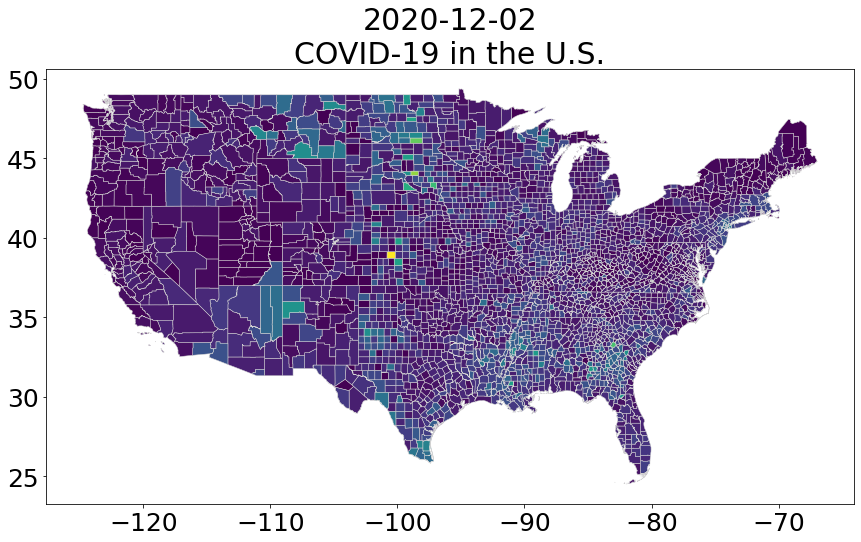

In [9]:
#COVID19Map.py
#. . . 

# only include observations within these boundaries
# this will shrink the size of the map
def select_data_within_bounds(data, minx, miny, maxx, maxy):
    data = data[data.bounds["maxx"] <= maxx]
    data = data[data.bounds["maxy"] <= maxy]
    data = data[data.bounds["minx"] >= minx]
    data = data[data.bounds["miny"] >= miny]
    
    return data

# . . . to end of script
# choose most recent date in data
date = dates[-1]

# choose map bounds
if "map_bounded" not in locals():
    minx = -127
    miny = 23
    maxx = -66
    maxy = 55
    covid_data = select_data_within_bounds(covid_data, minx, miny, maxx, maxy)
    map_bounded = True
    
fig, ax = plt.subplots(figsize=(18,8),
        subplot_kw = {'aspect': 'equal'})   
plt.rcParams.update({"font.size": 30})
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
key = "Deaths per Million"
df = covid_data[covid_data.index.get_level_values("date") == date]
df.plot(ax=ax, cax = ax, column=key, linewidth=.5, 
             edgecolor='lightgrey')
ax.set_title(str(date) + "\n" + "COVID-19 in the U.S.", fontsize = 30)

changes the color of the map to 4 different colors and ends the script

Text(0.5, 1.0, '2020-12-02\nCOVID-19 in the U.S.')

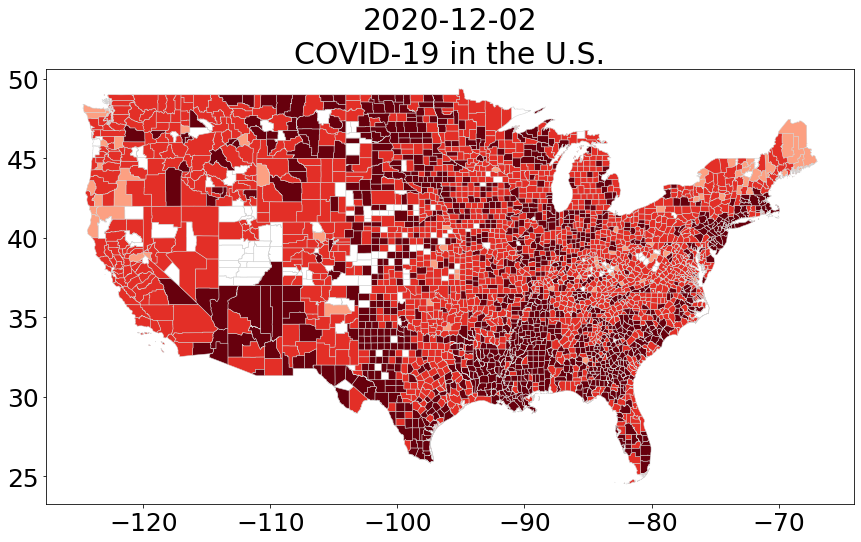

In [10]:
#COVID19Map.py
# . . . to end of script
fig, ax = plt.subplots(figsize=(18,8),
        subplot_kw = {'aspect': 'equal'})   
plt.rcParams.update({"font.size": 30})
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
key = "Deaths per Million"
# change colors, divide into 4 distinct colors
cmap = cm.get_cmap('Reds', 4)
vmin = 1 
vmax = df[key].max()

norm = cm.colors.LogNorm(vmin=vmin, vmax =vmax)
plt.cm.ScalarMappable(cmap=cmap, norm=norm)
df = covid_data[covid_data.index.get_level_values("date") == date]
df.plot(ax=ax, cax = ax, column=key, vmin=vmin ,vmax = vmax, 
             cmap = cmap, legend=False, linewidth=.5, edgecolor='lightgrey', 
             norm = norm)

ax.set_title(str(date) + "\n" + "COVID-19 in the U.S.", fontsize = 30)

adds a legend for the map from earlier about covid deaths and puts it in covid deaths in the millions

Text(0.5, 1.0, '2020-12-02\nCOVID-19 in the U.S.')

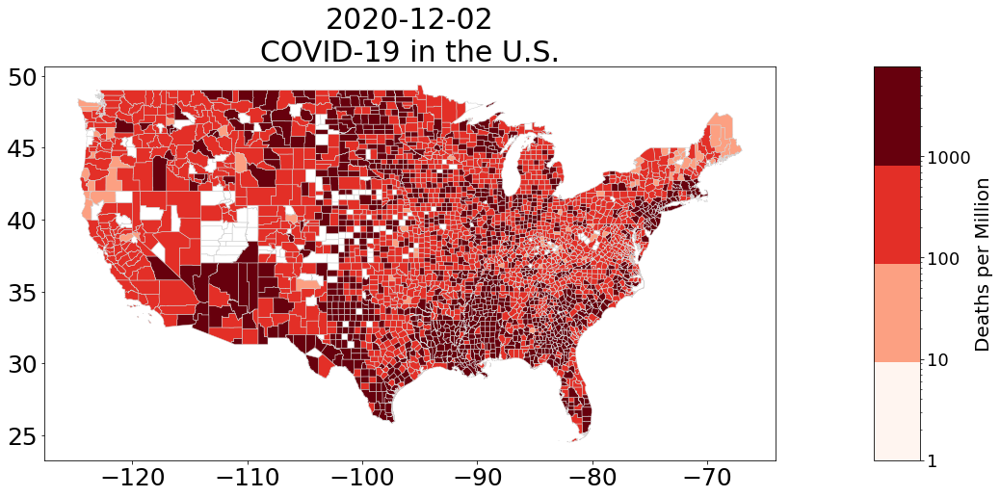

In [11]:
fig, ax = plt.subplots(figsize=(18,8),
        subplot_kw = {'aspect': 'equal'})   
plt.rcParams.update({"font.size": 30})
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
key = "Deaths per Million"
df = covid_data[covid_data.index.get_level_values("date")==date]
cmap = cm.get_cmap('Reds', 4)
vmin = 1 
vmax = df[key].max()
norm = cm.colors.LogNorm(vmin=vmin, vmax =vmax)

############## Add Colorbar ################
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
# empty array for the data range
sm._A = []
# prepare space for colorbar
divider = make_axes_locatable(ax)
size = "5%" 
cax = divider.append_axes("right", size = size, pad = 0.1)
# add colorbar to figure
cbar = fig.colorbar(sm, cax=cax, cmap = cmap)
cbar.ax.tick_params(labelsize=18)
vals = list(cbar.ax.get_yticks())
vals.append(vmax)
# format colorbar values as int
cbar.ax.set_yticklabels([int(x) for x in vals])
cbar.ax.set_ylabel(key, fontsize = 20)


df.plot(ax=ax, cax = ax, column=key, vmin=vmin ,vmax = vmax, 
             cmap = cmap, legend=False, linewidth=.5, edgecolor='lightgrey', 
             norm = norm)
ax.set_title(str(date)[:10] + "\n" + "COVID-19 in the U.S.", fontsize = 30)

shows cases in the millions

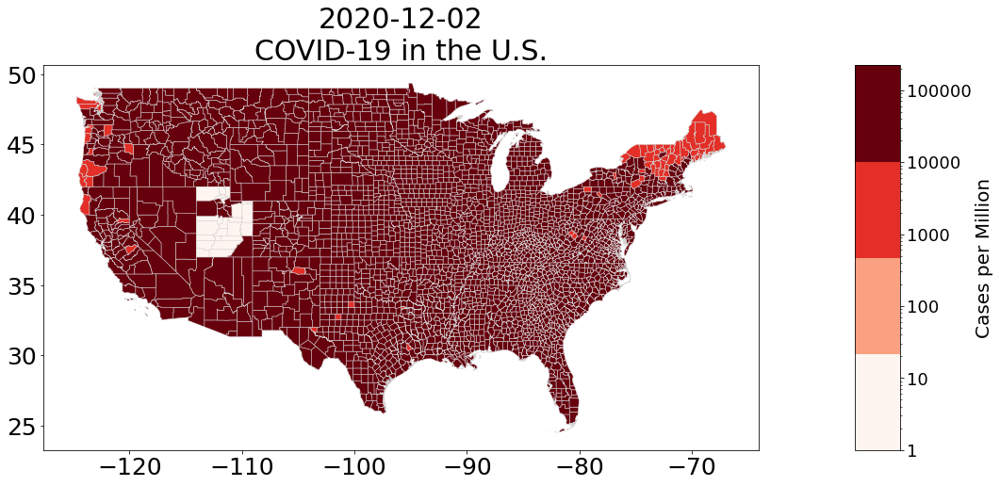

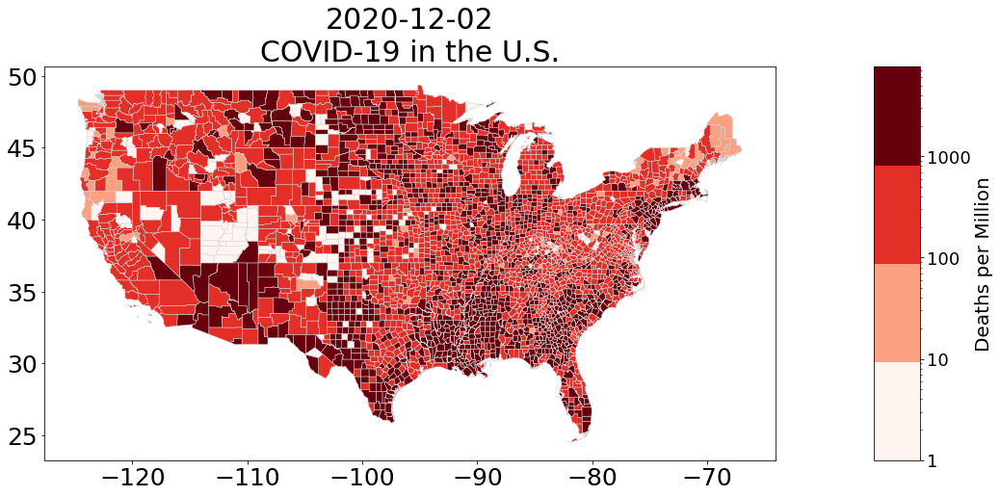

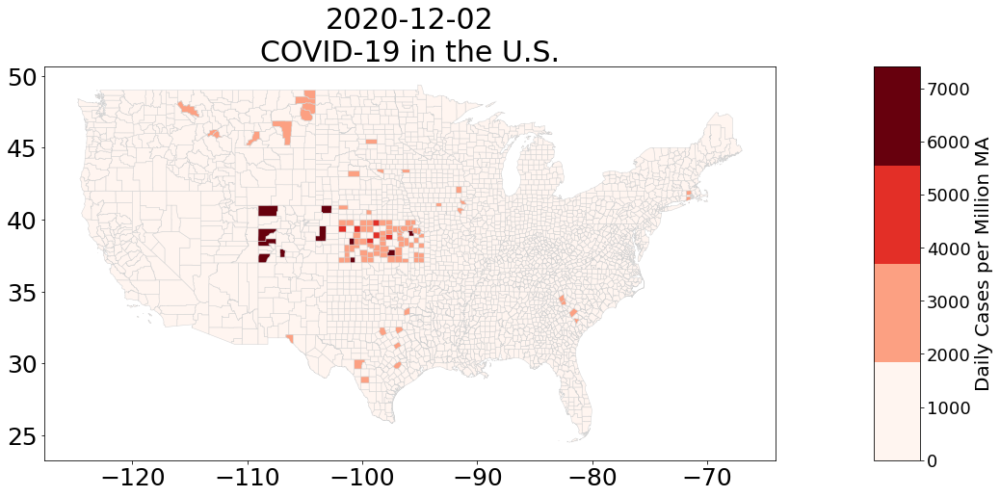

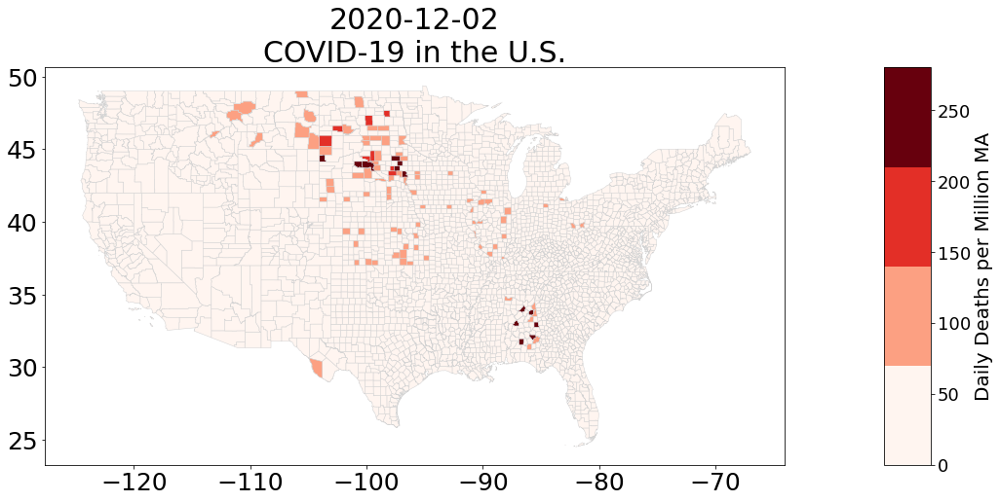

In [12]:
keys = ["Cases per Million", "Deaths per Million", 
        "Daily Cases per Million MA", "Daily Deaths per Million MA"]
for key in keys:
    # identify whether or not to log values for color axis
    # if daily rates, do not log. Only log totals.
    log = False if "Daily" in key else True
    fig, ax = plt.subplots(figsize=(18,8),
        subplot_kw = {'aspect': 'equal'})   
    plt.rcParams.update({"font.size": 30})
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    # this time we replace 0 values with 1
    # so that these values show up as beige instead of as white
    # when color axis is logged
    df = covid_data[covid_data.index.get_level_values("date")==date].replace(0,1)
    # set range of colorbar
    vmin = 1 if log else 0 
    vmax = df[key].max()
    # choose colormap
    cmap = cm.get_cmap('Reds', 4)
    # format colormap
    if log:
        norm = cm.colors.LogNorm(vmin=vmin, vmax =vmax)
    else:
        norm = cm.colors.Normalize(vmin = vmin, vmax = vmax)
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    # empty array for the data range
    sm._A = []
    # prepare space for colorbar
    divider = make_axes_locatable(ax)
    size = "5%" 
    cax = divider.append_axes("right", size = size, pad = 0.1)
    # add colorbar to figure
    cbar = fig.colorbar(sm, cax=cax, cmap = cmap)
    cbar.ax.tick_params(labelsize=18)
    vals = list(cbar.ax.get_yticks())
    vals.append(vmax)

    # format colorbar values as int
    cbar.ax.set_yticklabels([int(x) for x in vals])
    cbar.ax.set_ylabel(key, fontsize = 20)


    df.plot(ax=ax, cax = cax, column=key, vmin=vmin ,vmax = vmax, 
                 cmap = cmap, legend=False, linewidth=.5, edgecolor='lightgrey', 
                 norm = norm)
    ax.set_title(str(date)[:10] + "\n" + "COVID-19 in the U.S.", fontsize = 30)

    plt.show()
    plt.close()

creates 2 new maps of cases per day and deaths per day both in millions and puts all 4 graph up for comparison

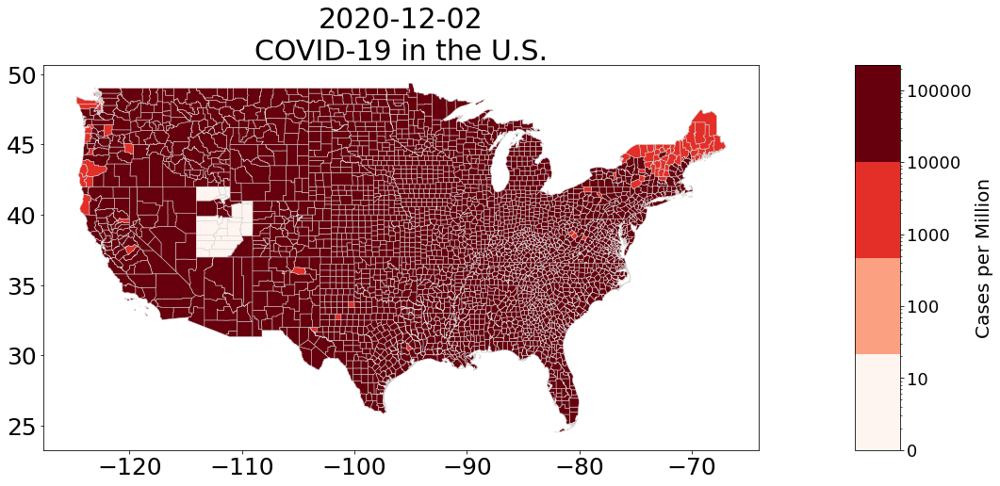

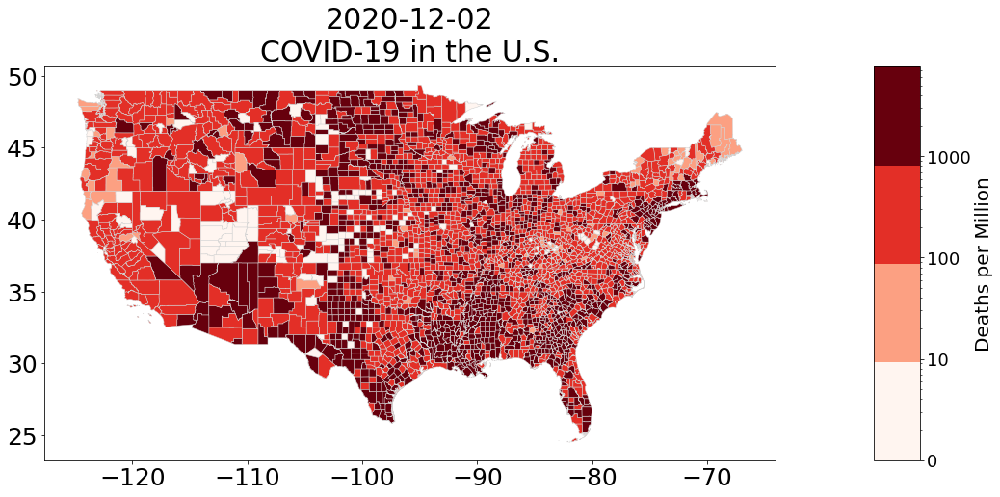

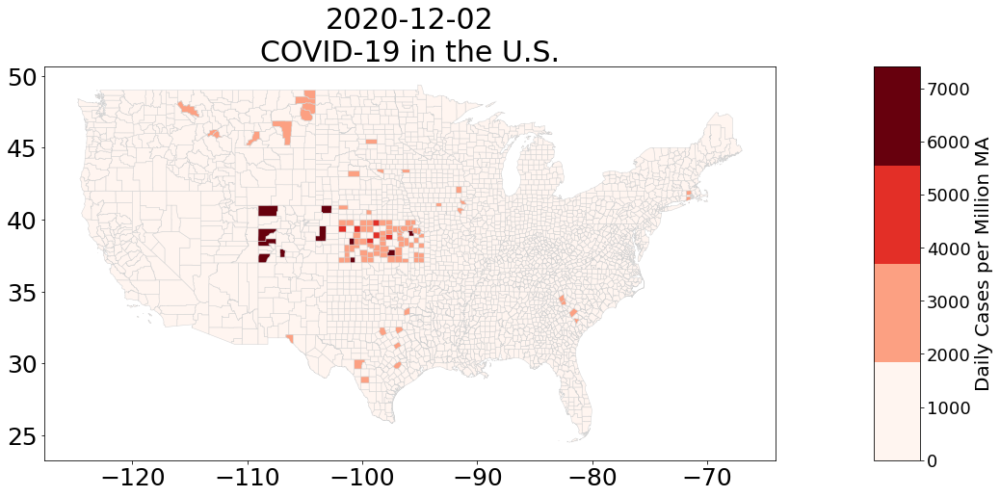

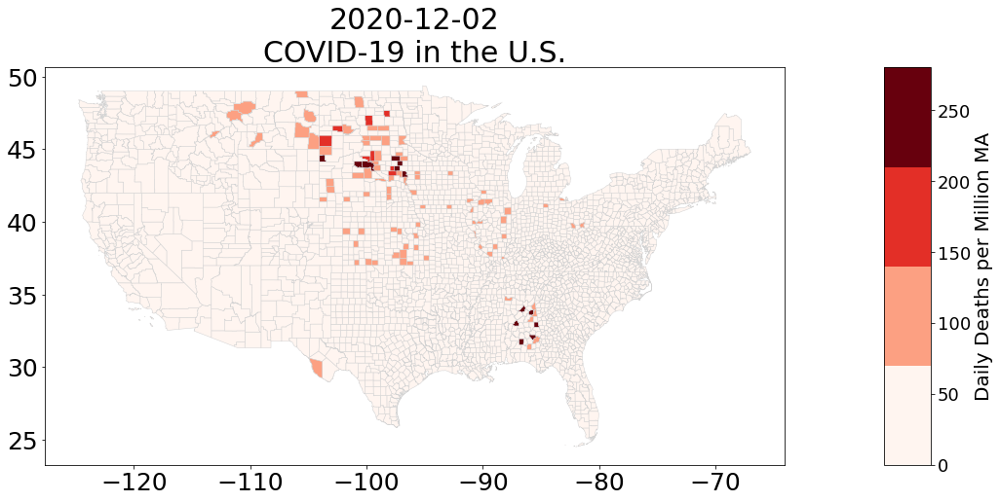

In [13]:
from matplotlib import cm
# If you choose to make a dynamic visualization for the homework
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as mtick
from matplotlib.backends.backend_pdf import PdfPages
def select_data_within_bounds(data, minx, miny, maxx, maxy):
    data = data[data.bounds["maxx"] <= maxx]
    data = data[data.bounds["maxy"] <= maxy]
    data = data[data.bounds["minx"] >= minx]
    data = data[data.bounds["miny"] >= miny]
    
    return data

def plot_map(*kwargs):
    plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    plot_df = df[df.index.get_level_values("date")==date]
    plot_df.plot(ax=ax, cax = ax, column=key, vmin=vmin ,vmax = vmax, 
                 cmap = cmap, legend=False, linewidth=.5, edgecolor='lightgrey', 
                 norm = norm)
    ax.set_title(str(date)[:10] + "\n" + "COVID-19 in the U.S.", fontsize = 30)
    
def init(*kwargs):
    size = "5%"     
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    # empty array for the data range
    sm._A = []
    # add the colorbar to the figure
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size = size, pad = 0.1)
    # add colorbar to figure
    cbar = fig.colorbar(sm, cax=cax, cmap = cmap)
    cbar.ax.tick_params(labelsize=18)
    vals = list(cbar.ax.get_yticks())
    vals.append(vmax)
    if "Daily" not in key: vals[0] = 0 
    # format colorbar with logged or observed values
    if log:
        cbar.ax.yaxis.set_major_formatter(mtick.LogFormatter())
    else:
        cbar.ax.yaxis.set_major_formatter(mtick.Formatter())
    # format colorbar values as int
    cbar.ax.set_yticklabels([int(x) for x in vals])
    cbar.ax.set_ylabel(key, fontsize = 20)
date = dates[-1]
keys = ["Cases per Million", "Deaths per Million", 
        "Daily Cases per Million MA", "Daily Deaths per Million MA"]

if "map_bounded" not in locals():
    minx = -127
    miny = 23
    maxx = -58
    maxy = 54
    covid_data = select_data_within_bounds(covid_data, minx, miny, maxx, maxy)
    map_bounded = True
    
pp=PdfPages("covid data.pdf")

for key in keys:
    log = False if "Daily" in key else True
    # this time we replace 0 values with 1
    # so that these values show up as beige  instead of as white
    # when color axis is logged
    vmin = 1 if log else 0 
    vmax = df[key][df.index.get_level_values("date") == date].max()
    # Create colorbar as a legend
    cmap = cm.get_cmap('Reds', 4)
    if log:
        norm = cm.colors.LogNorm(vmin=vmin, vmax =vmax)
    else:
        norm = cm.colors.Normalize(vmin = vmin, vmax = vmax)

    fig, ax = plt.subplots(figsize=(18,8),
        subplot_kw = {'aspect': 'equal'})   
    plt.rcParams.update({"font.size": 30})
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    # the functions will unpack the tuple. The same names variable names
    # are used in the function
    kwargs = (df, key, log, date, fig, ax, cmap, norm, vmin, vmax)
    init(kwargs)
    plot_map(kwargs)
    
    plt.show()
    pp.savefig(fig, bbox_inches="tight")
    plt.close()
pp.close()

imports unemployment data and defines some items for the code

In [14]:
#import unemployment data
u_data = pd.read_csv(
    "countyUnemploymentData.csv", encoding = "latin1", parse_dates = True)
index = u_data["fips_code"].dropna(axis = 0).index
u_data = u_data.loc[index]
u_data["fips_code"] = u_data["fips_code"].astype(int)
#u_data["fips_code"] = u_data[
#    "state_fips"].astype(str) + u_data["county_fips"].astype(str)
#u_data["fips_code"] = u_data["fips_code"].astype(int)
u_data.set_index(["fips_code", "date"], inplace = True)
#u_data["state_abr"] = u_data["Location"][-2:]

shows the unemployment data

In [15]:
u_data.index

MultiIndex(levels=[[1001, 1003, 1005, 1007, 1009, 1011, 1013, 1015, 1017, 1019, 1021, 1023, 1025, 1027, 1029, 1031, 1033, 1035, 1037, 1039, 1041, 1043, 1045, 1047, 1049, 1051, 1053, 1055, 1057, 1059, 1061, 1063, 1065, 1067, 1069, 1071, 1073, 1075, 1077, 1079, 1081, 1083, 1085, 1087, 1089, 1091, 1093, 1095, 1097, 1099, 1101, 1103, 1105, 1107, 1109, 1111, 1113, 1115, 1117, 1119, 1121, 1123, 1125, 1127, 1129, 1131, 1133, 2013, 2016, 2020, 2050, 2060, 2068, 2070, 2090, 2100, 2105, 2110, 2122, 2130, 2150, 2158, 2164, 2170, 2180, 2185, 2188, 2195, 2198, 2220, 2230, 2240, 2261, 2275, 2282, 2290, 4001, 4003, 4005, 4007, 4009, 4011, 4012, 4013, 4015, 4017, 4019, 4021, 4023, 4025, 4027, 5001, 5003, 5005, 5007, 5009, 5011, 5013, 5015, 5017, 5019, 5021, 5023, 5025, 5027, 5029, 5031, 5033, 5035, 5037, 5039, 5041, 5043, 5045, 5047, 5049, 5051, 5053, 5055, 5057, 5059, 5061, 5063, 5065, 5067, 5069, 5071, 5073, 5075, 5077, 5079, 5081, 5083, 5085, 5087, 5089, 5091, 5093, 5095, 5097, 5099, 5101, 5103, 51

names functions and tells the program what things are supposed to be and uses for loops to tell the program what to do

In [16]:
#COVID19Map.py
#. . . 
def create_merged_geo_dataframe(data, map_data, dates):
    data_frame_initialized = False
    counties = sorted(
        list(
            set(data.index.get_level_values("fips_code"))))
    for date in dates:
        # select county observations from each date in dates
        # select only the subset of counties in the map that
        # are also present in the covid_data
        agg_df = map_data.loc[counties]
        agg_df["date"] = date
        if data_frame_initialized == False:
            #Create new dataframe
            matching_gpd = geopandas.GeoDataFrame(agg_df, crs = map_data.crs)
            data_frame_initialized = True        
        
        else:
            # or stack thenew  data frame and the dataframe that was initialized at
            # i = 0
            matching_gpd = matching_gpd.append(agg_df, ignore_index = False)
    # reset index, then set to [fips, date]
    matching_gpd.reset_index(inplace=True)
    matching_gpd.set_index(["fips_code", "date"], inplace = True)
    
    for key, val in data.items():
        matching_gpd[key] = val
    return matching_gpd

In [17]:
dates = list(set(u_data.index.get_level_values("date")))
u_data = create_merged_geo_dataframe(u_data, map_data, dates)

/Users/shoo/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  if sys.path[0] == '':


sets map boundaries

In [18]:
# choose map bounds
#if "u_map_bounded" not in locals():
minx = -127
miny = 23
maxx = -66
maxy = 50
u_data = select_data_within_bounds(u_data, minx, miny, maxx, maxy)
u_map_bounded = True

sets it up for by country data from the lised dates

In [19]:
counties = sorted(list(set(u_data.index.get_level_values("fips_code"))))
dates = ["Aug-19",
         "Sep-19",
         "Oct-19",
         "Nov-19",
         "Dec-19",
         "Jan-20",
         "Feb-20",
         "Mar-20",
         "Apr-20",
         "May-20",
         "Jun-20",
         "Jul-20",
         "Aug-20",
         "Sep-20"]

shows the unemploymet rate on the usa map by county for the selected dates

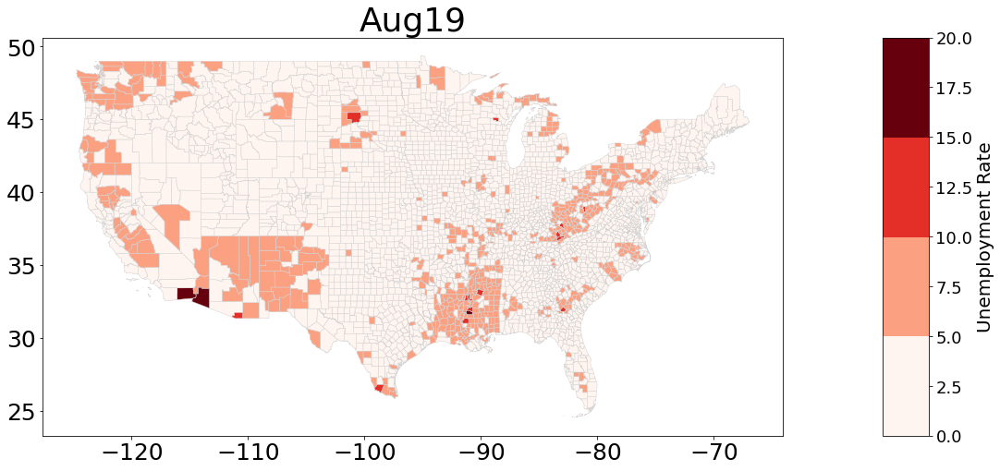

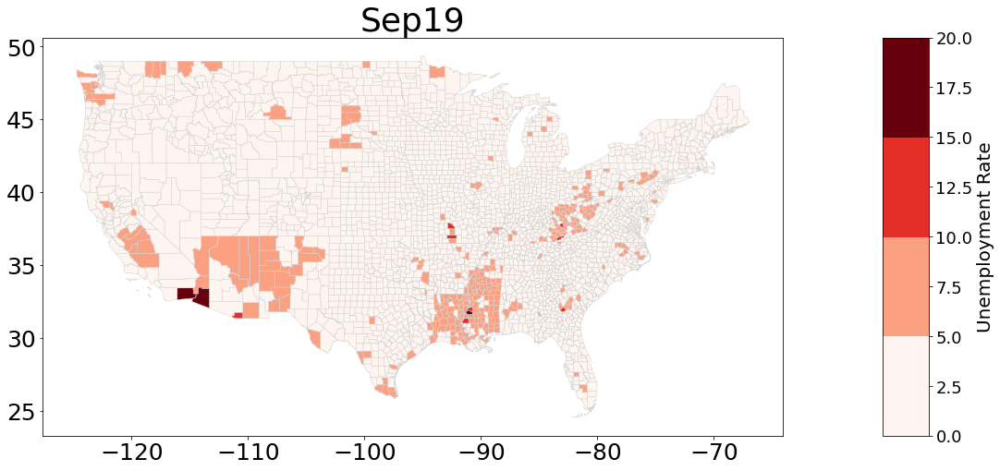

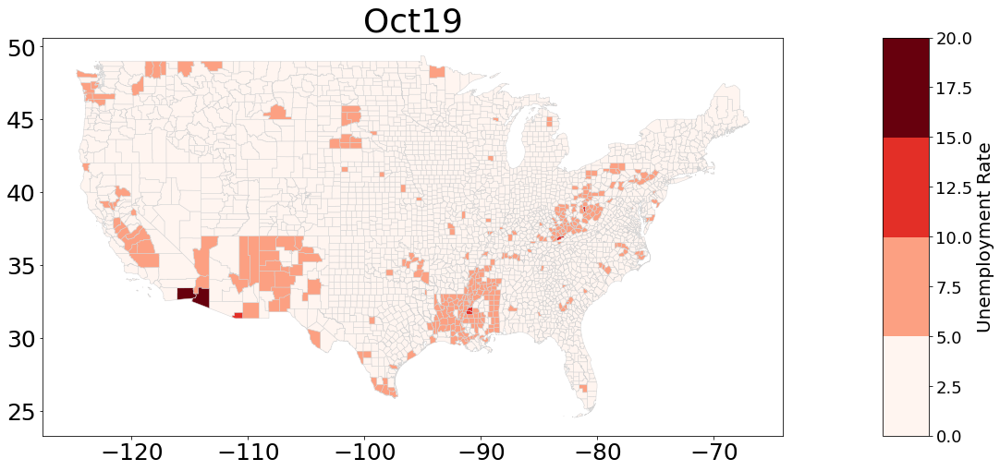

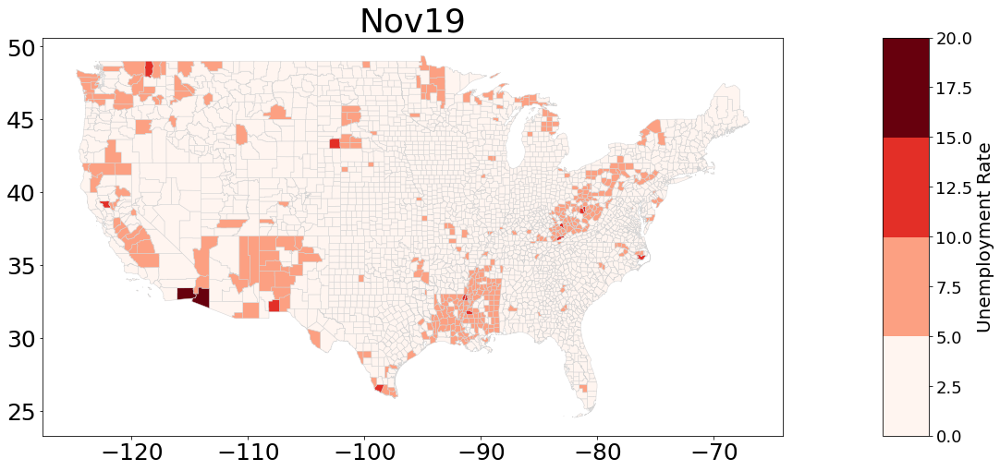

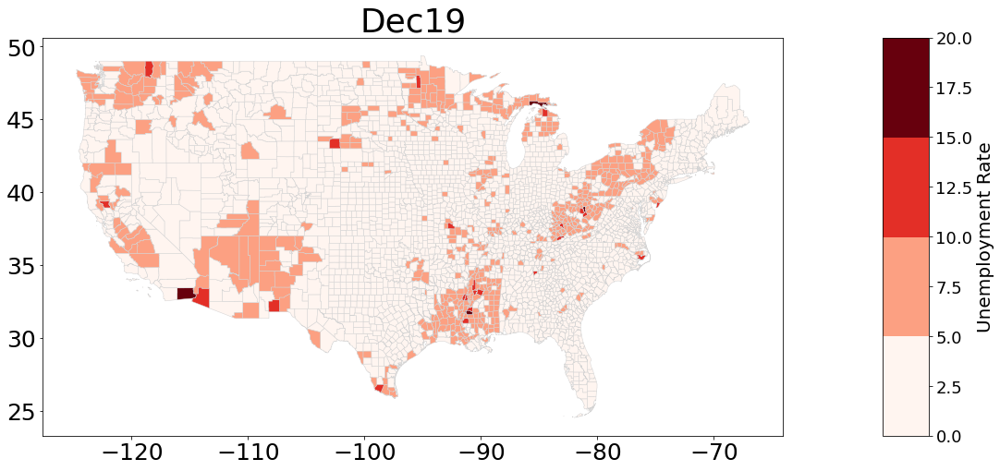

...

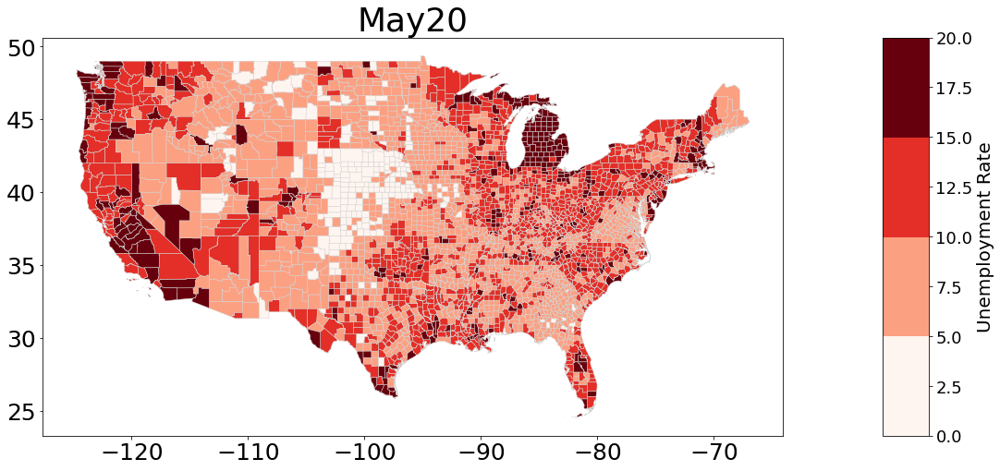

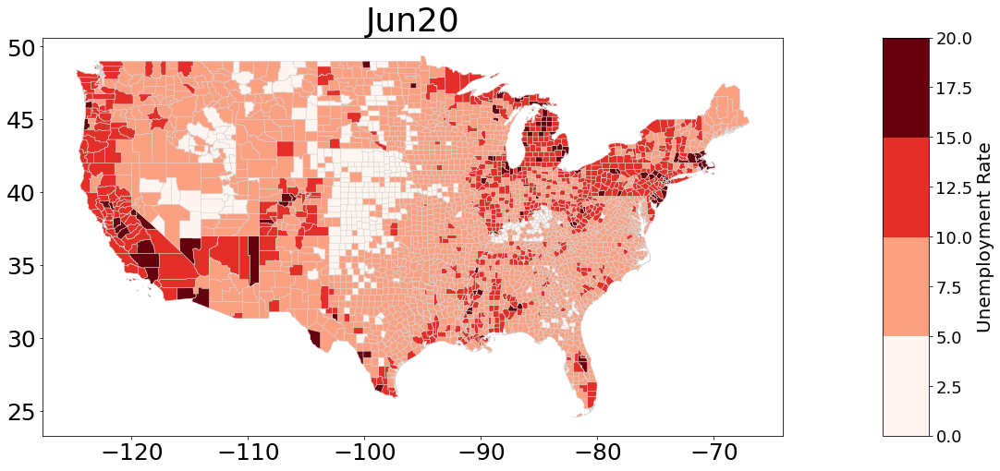

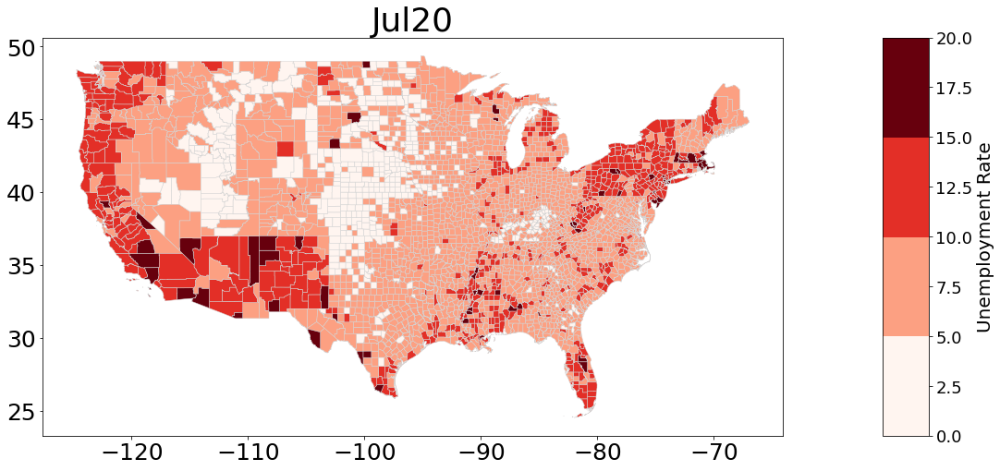

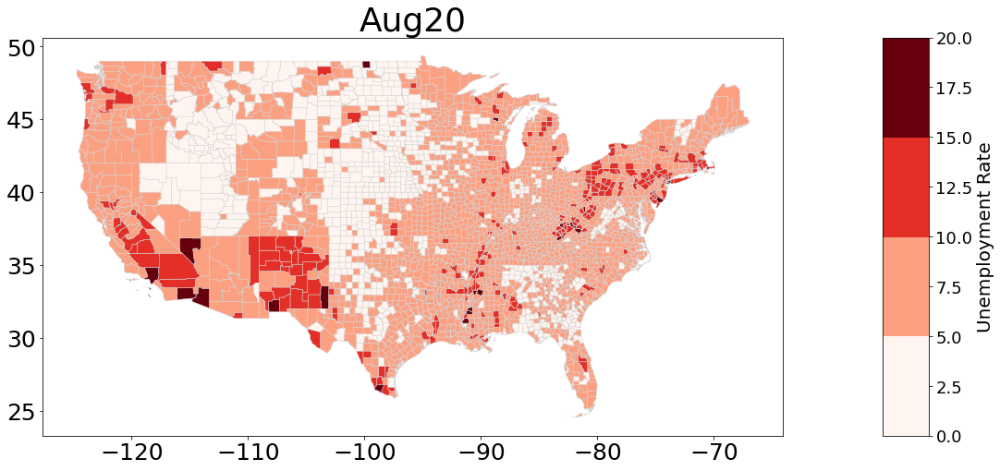

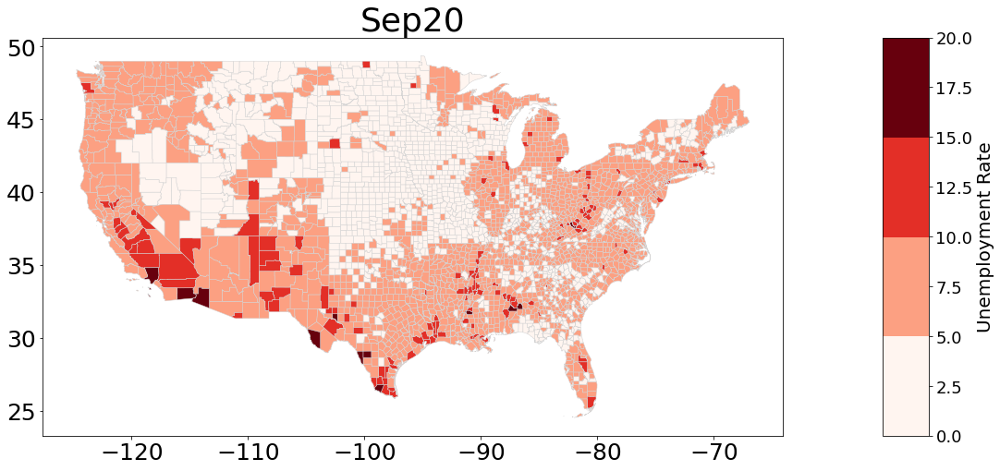

In [20]:
key = "Unemployment Rate"

u_data[key] = u_data[key].astype(float)
for date in dates:
    fig, ax = plt.subplots(figsize=(19,9),
                          subplot_kw = {"aspect":"equal"})
    plt.rcParams.update({"font.size": 30})

    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)

    vmin = 0
    #vmax = u_data[key].fillna(0).max()
    vmax = 20
    cmap = cm.get_cmap("Reds", 4)
    norm = cm.colors.Normalize(vmin=vmin, vmax=vmax)
    ### add colorbar
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    # empty array for the data range
    sm.A = []
    # prepare space for colorbar
    divider = make_axes_locatable(ax)
    size = "5%"
    cax = divider.append_axes("right", size = size, pad = .1)
    # add colorbar to figure
    cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
    cbar.ax.tick_params(labelsize=18)
    vals = list(cbar.ax.get_yticks())
    vals.append(vmax)
    cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])
    cbar.ax.set_ylabel(key, fontsize=20)

    df = u_data[u_data.index.get_level_values("date") == date]#.dropna(axis=0)
    df.plot(ax=ax, cax=ax, column = key,
            vmin=vmin, vmax=vmax,
            cmap=cmap, legend=False, 
            linewidth = .5, edgecolor="lightgrey",norm=norm)
    ax.set_title(date.replace("-", ""))
    plt.show()
    plt.close()

In [ ]:
creates key as the unemployment rate and tells the program what to do with a for loop

In [21]:
# Normalize Unemployment Feb-20 == 1
key = "Unemployment Rate"
n_u_data = u_data.copy()
key = "Unemployment Rate"
for county in counties:
    n_u_data[key][county] = n_u_data.loc[county, key].div(n_u_data.loc[county, "Feb-20"][key])

/Users/shoo/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


sets up unemployment rates for the selected moneths side by side and sets up all the graph peramiters

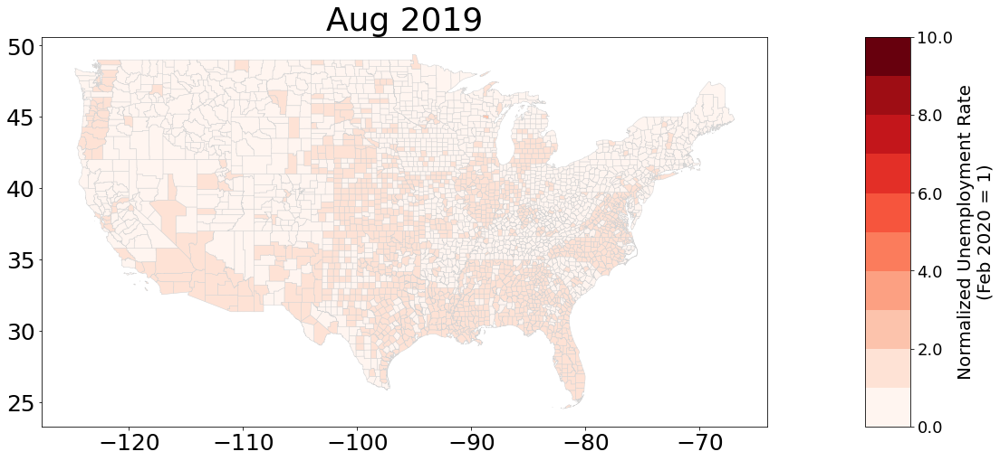

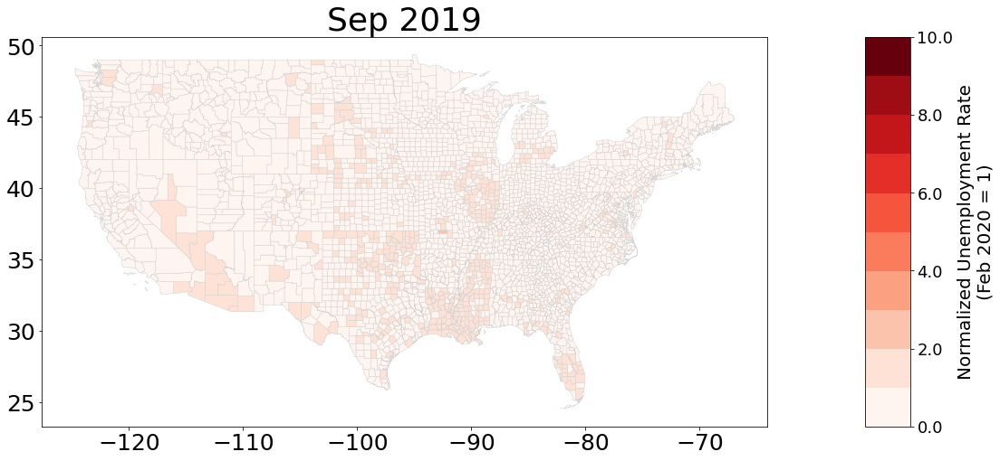

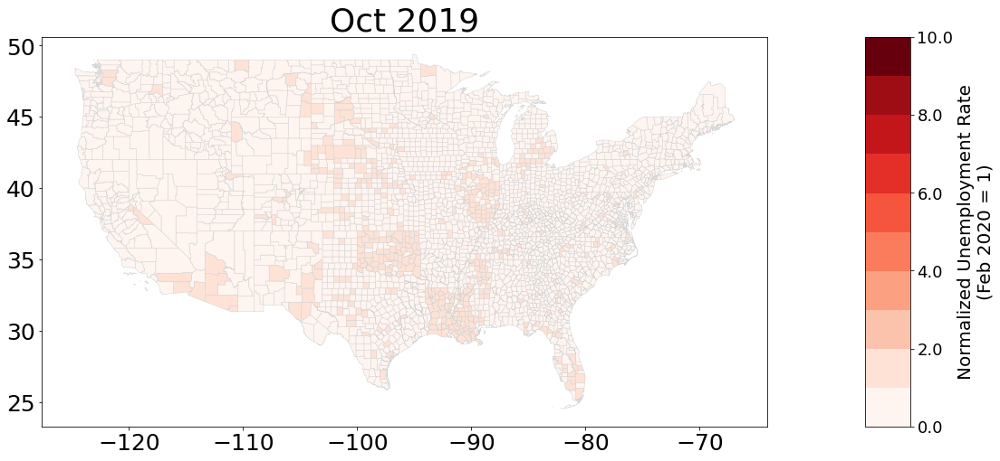

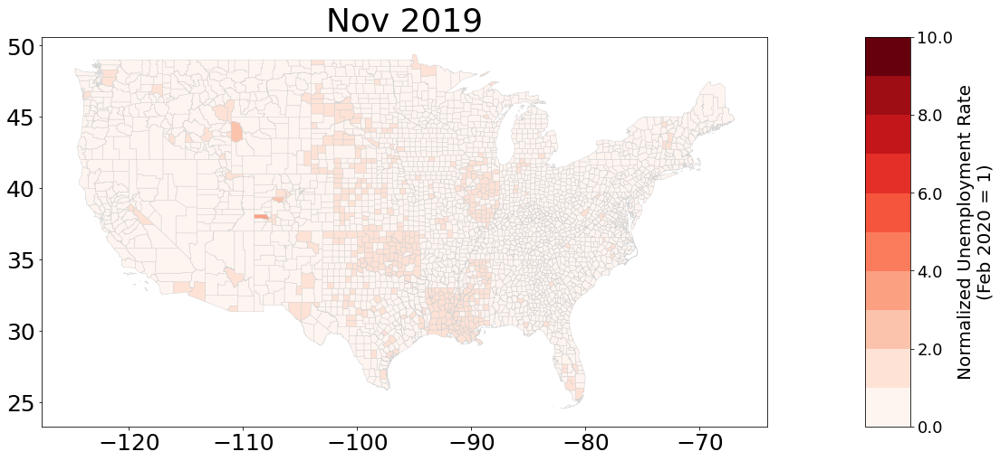

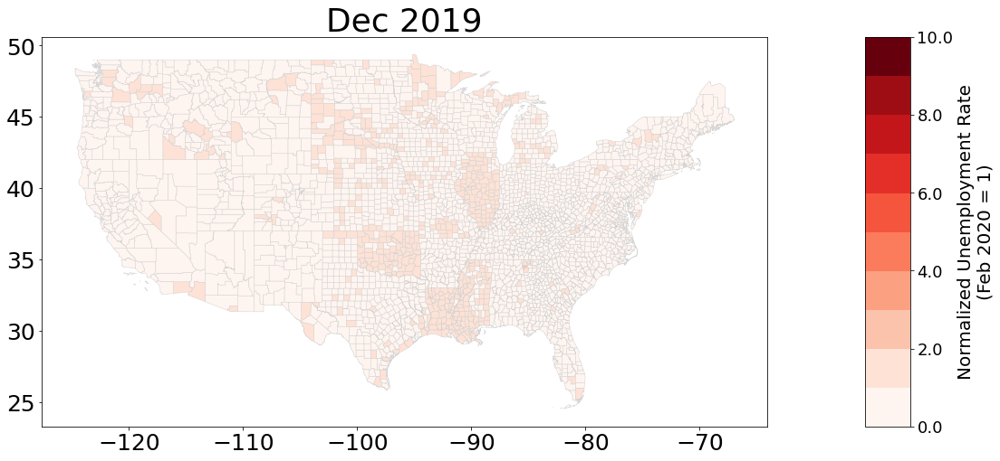

...

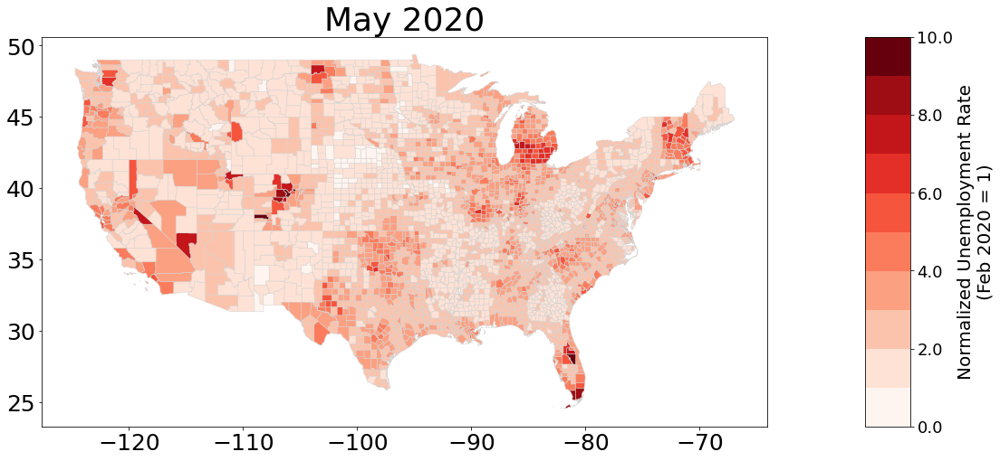

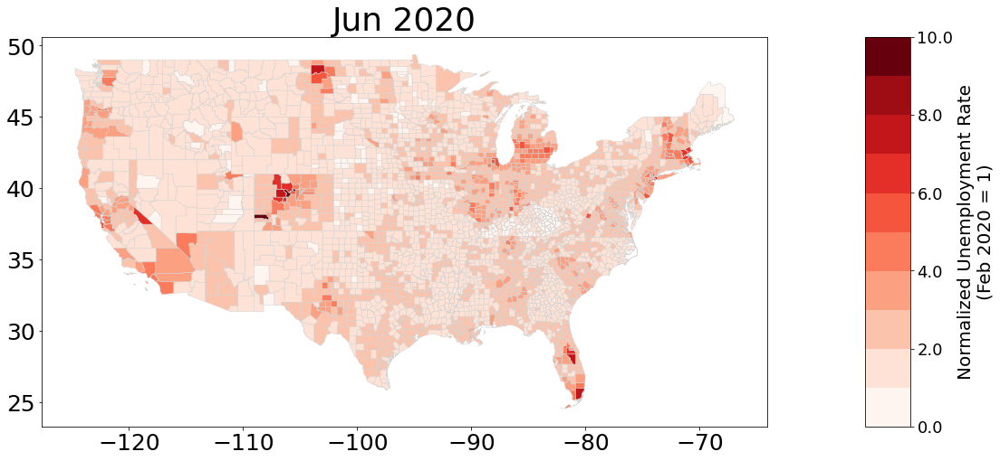

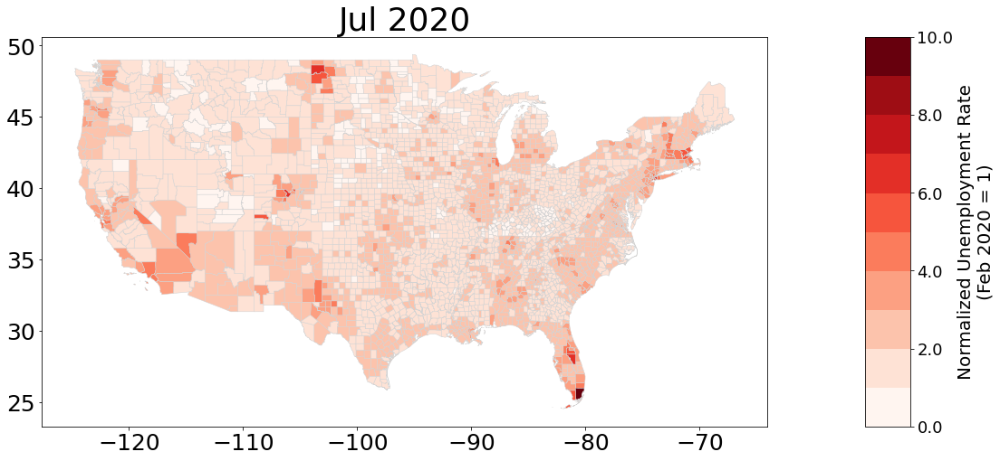

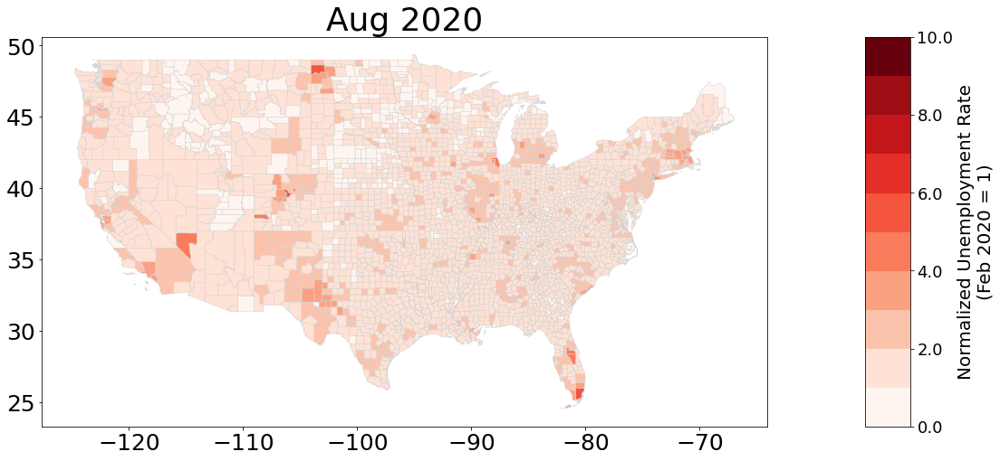

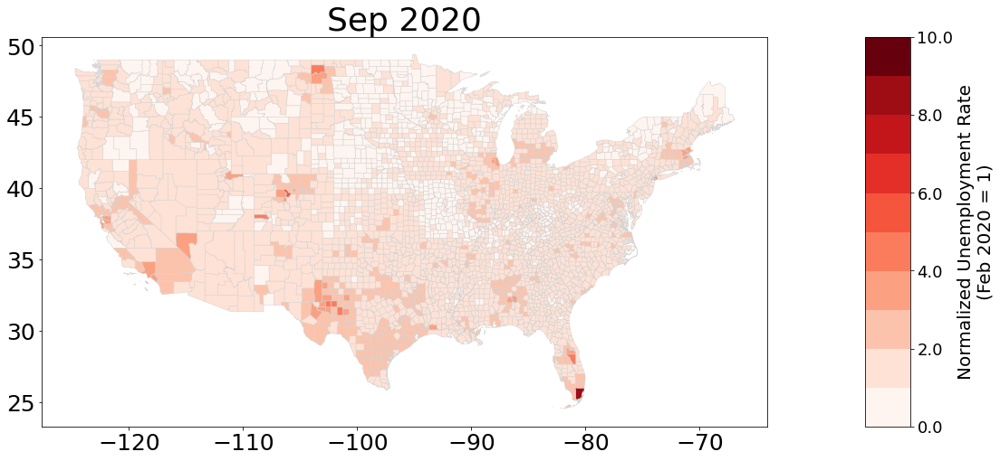

In [22]:
for date in dates:
    title_date = date[:-3]+" 20" + date[-2:]
    fig, ax = plt.subplots(figsize=(19,9),
                          subplot_kw = {"aspect":"equal"})
    plt.rcParams.update({"font.size": 30})

    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)

    vmin = 0# n_u_data["Unemployment Rate"].min()
    vmax = 10
    cmap = cm.get_cmap("Reds", 10)
    norm = cm.colors.Normalize(vmin=vmin, vmax=vmax)
    ### add colorbar
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    # empty array for the data range
    sm.A = []
    # prepare space for colorbar
    divider = make_axes_locatable(ax)
    size = "5%"
    cax = divider.append_axes("right", size = size, pad = .1)
    # add colorbar to figure
    cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
    cbar.ax.tick_params(labelsize=18)
    vals = list(cbar.ax.get_yticks())
    vals.append(vmax)
    cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])
    cbar.ax.set_ylabel("Normalized "+key + "\n(Feb 2020 = 1)", fontsize=20)
    
    df = n_u_data[n_u_data.index.get_level_values("date") == date]#.dropna(axis=0)
    df.plot(ax=ax, cax=ax, column = key,
            vmin=vmin, vmax=vmax,
            cmap=cmap, legend=False, 
            linewidth = .5, edgecolor="lightgrey",norm=norm)
    ax.set_title(title_date)
    plt.show()
    plt.close()

working with panel data

In [23]:
#multiIndex.py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

data = pd.read_excel("mpd2018.xlsx",
                    sheet_name = "Full data",
                    index_col = [0, 2])
data

country  cgdppc  rgdpnapc      pop         i_cig  \
countrycode year                                                         
AFG         1820  Afghanistan     NaN       NaN   3280.0           NaN   
            1870  Afghanistan     NaN       NaN   4207.0           NaN   
            1913  Afghanistan     NaN       NaN   5730.0           NaN   
            1950  Afghanistan  2392.0    2392.0   8150.0  Extrapolated   
            1951  Afghanistan  2422.0    2422.0   8284.0  Extrapolated   
            1952  Afghanistan  2462.0    2462.0   8425.0  Extrapolated   
            1953  Afghanistan  2568.0    2568.0   8573.0  Extrapolated   
            1954  Afghanistan  2576.0    2576.0   8728.0  Extrapolated   
            1955  Afghanistan  2579.0    2579.0   8891.0  Extrapolated   
            1956  Afghanistan  2644.0    2644.0   9062.0  Extrapolated   
            1957  Afghanistan  2593.0    2593.0   9241.0  Extrapolated   
            1958  Afghanistan  2684.0    2684.0   9429.0  Extrapolated   
            1959  Afghanistan  2705.0    2705.0   9625.0  Extrapolated   
            1960  Afghanistan  2744.0    2744.0   9829.0  Extrapolated   
            1961  Afghanistan  2708.0    2708.0  10043.0  Extrapolated   
            1962  Afghanistan  2695.0    2695.0  10267.0  Extrapolated   
            1963  Afghanistan  2683.0    2683.0  10501.0  Extrapolated   
            1964  Afghanistan  2673.0    2673.0  10744.0  Extrapolated   
            1965  Afghanistan  2670.0    2670.0  10998.0  Extrapolated   
            1966  Afghanistan  2633.0    2633.0  11262.0  Extrapolated   
            1967  Afghanistan  2642.0    2642.0  11538.0  Extrapolated   
            1968  Afghanistan  2670.0    2670.0  11825.0  Extrapolated   
            1969  Afghanistan  2646.0    2646.0  12123.0  Extrapolated   
            1970  Afghanistan  2632.0    2632.0  12431.0  Extrapolated   
            1971  Afghanistan  2560.0    2560.0  12749.0  Extrapolated   
            1972  Afghanistan  2086.0    2086.0  13079.0  Extrapolated   
            1973  Afghanistan  2091.0    2091.0  13421.0  Extrapolated   
            1974  Afghanistan  2149.0    2149.0  13772.0  Extrapolated   
            1975  Afghanistan  2225.0    2225.0  14132.0  Extrapolated   
            1976  Afghanistan  2286.0    2286.0  14501.0  Extrapolated   
...                       ...     ...       ...      ...           ...   
ZWE         1987     Zimbabwe  3243.0    2070.0   9216.0  Interpolated   
            1988     Zimbabwe  3340.0    2182.0   9560.0  Interpolated   
            1989     Zimbabwe  3369.0    2252.0   9868.0  Interpolated   
            1990     Zimbabwe  3265.0    2232.0  10156.0  Interpolated   
            1991     Zimbabwe  3280.0    2292.0  10437.0  Interpolated   
            1992     Zimbabwe  2845.0    2030.0  10720.0  Interpolated   
            1993     Zimbabwe  2749.0    2004.0  10976.0  Interpolated   
            1994     Zimbabwe  2913.0    2167.0  11086.0  Interpolated   
            1995     Zimbabwe  2841.0    2156.0  11159.0  Interpolated   
            1996     Zimbabwe  3032.0    2346.0  11317.0  Interpolated   
            1997     Zimbabwe  3013.0    2377.0  11469.0  Interpolated   
            1998     Zimbabwe  3006.0    2417.0  11607.0  Interpolated   
            1999     Zimbabwe  2889.0    2367.0  11733.0  Interpolated   
            2000     Zimbabwe  2696.0    2249.0  11820.0  Interpolated   
            2001     Zimbabwe  2624.0    2228.0  11868.0  Interpolated   
            2002     Zimbabwe  2376.0    2054.0  11866.0  Interpolated   
            2003     Zimbabwe  1958.0    1722.0  11816.0  Interpolated   
            2004     Zimbabwe  1813.0    1622.0  11735.0  Interpolated   
            2005     Zimbabwe  1660.0    1510.0  11639.0  Interpolated   
            2006     Zimbabwe  1587.0    1467.0  11544.0  Interpolated   
            2007     Zimbabwe  1522.0    1431.0  11443.0  Interpolated   
            2008     Zimba

defines countries

In [24]:
countries = data.groupby("countrycode").mean().index
countries

Index(['AFG', 'AGO', 'ALB', 'ARE', 'ARG', 'ARM', 'AUS', 'AUT', 'AZE', 'BDI',
       ...
       'URY', 'USA', 'UZB', 'VEN', 'VNM', 'YEM', 'YUG', 'ZAF', 'ZMB', 'ZWE'],
      dtype='object', name='countrycode', length=169)

defines years

In [25]:
years = data.groupby("year").mean().index
years

Int64Index([   1,  730, 1000, 1150, 1280, 1281, 1282, 1283, 1284, 1285,
            ...
            2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016],
           dtype='int64', name='year', length=741)

displays data for the "year

In [26]:
data.groupby("year").sum()

,cgdppc,rgdpnapc,pop
year,,,
1,16453.0,16453.0,201470.0
730,2917.0,3521.0,0.0
1000,3878.0,4457.0,224470.0
1150,3855.0,3979.0,0.0
1280,2743.0,3366.0,0.0
1281,1026.0,1329.0,0.0
1282,999.0,1294.0,0.0
1283,986.0,1276.0,0.0
1284,972.0,1259.0,0.0


displays the country code data

In [27]:
data.groupby("countrycode").diff()

cgdppc  rgdpnapc     pop
countrycode year                          
AFG         1820     NaN       NaN     NaN
            1870     NaN       NaN   927.0
            1913     NaN       NaN  1523.0
            1950     NaN       NaN  2420.0
            1951    30.0      30.0   134.0
            1952    40.0      40.0   141.0
            1953   106.0     106.0   148.0
            1954     8.0       8.0   155.0
            1955     3.0       3.0   163.0
            1956    65.0      65.0   171.0
            1957   -51.0     -51.0   179.0
            1958    91.0      91.0   188.0
            1959    21.0      21.0   196.0
            1960    39.0      39.0   204.0
            1961   -36.0     -36.0   214.0
            1962   -13.0     -13.0   224.0
            1963   -12.0     -12.0   234.0
            1964   -10.0     -10.0   243.0
            1965    -3.0      -3.0   254.0
            1966   -37.0     -37.0   264.0
            1967     9.0       9.0   276.0
            1968    28.0      28.0   287.0
            1969   -24.0     -24.0   298.0
            1970   -14.0     -14.0   308.0
            1971   -72.0     -72.0   318.0
            1972  -474.0    -474.0   330.0
            1973     5.0       5.0   342.0
            1974    58.0      58.0   351.0
            1975    76.0      76.0   360.0
            1976    61.0      61.0   369.0
...                  ...       ...     ...
ZWE         1987  -249.0    -106.0   339.0
            1988    97.0     112.0   344.0
            1989    29.0      70.0   308.0
            1990  -104.0     -20.0   288.0
            1991    15.0      60.0   281.0
            1992  -435.0    -262.0   283.0
            1993   -96.0     -26.0   256.0
            1994   164.0     163.0   110.0
            1995   -72.0     -11.0    73.0
            1996   191.0     190.0   158.0
            1997   -19.0      31.0   152.0
            1998    -7.0      40.0   138.0
            1999  -117.0     -50.0   126.0
            2000  -193.0    -118.0    87.0
            2001   -72.0     -21.0    48.0
            2002  -248.0    -174.0    -2.0
            2003  -418.0    -332.0   -50.0
            2004  -145.0    -100.0   -81.0
            2005  -153.0    -112.0   -96.0
            2006   -73.0     -43.0   -95.0
            2007   -65.0     -36.0  -101.0
            2008  -262.0    -228.0   -93.0
            2009    69.0      86.0    43.0
            2010    96.0     115.0   259.0
            2011    90.0     111.0   432.0
            2012   108.0      89.0   536.0
            2013   178.0       0.0   563.0
            2014    -4.0     -10.0   589.0
            2015   -38.0     -34.0   458.0
            2016   -30.0     -26.0   317.0

[19873 rows x 3 columns]

makes a graph that shows the different gdps for each 2 ountries we selected to compare it also tells the program what to do with a for loop

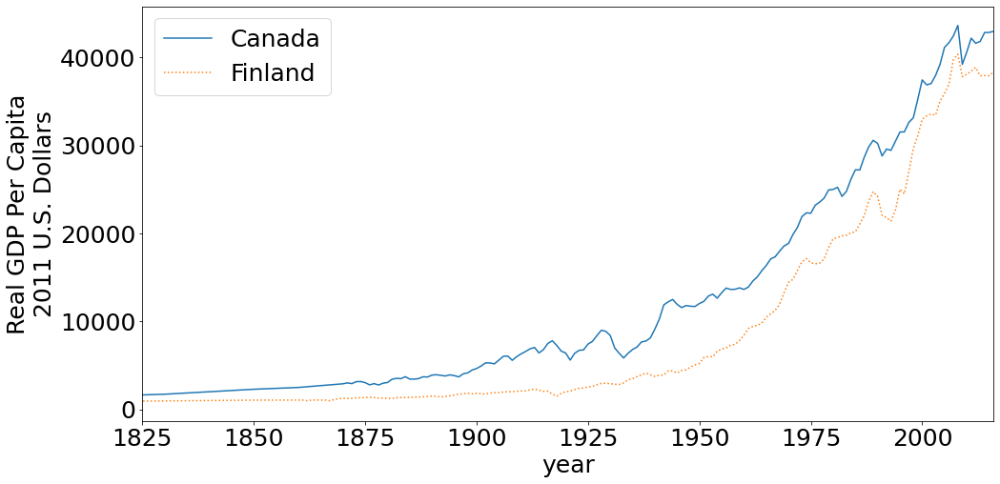

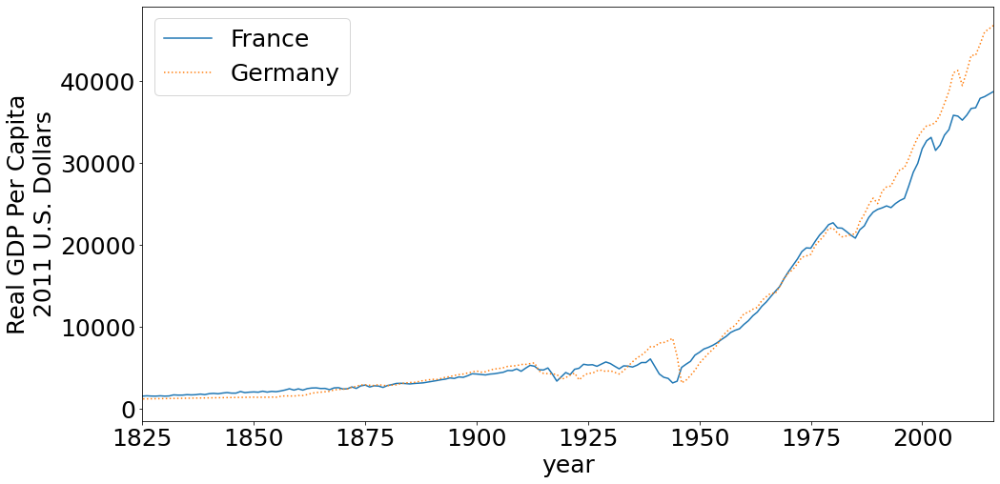

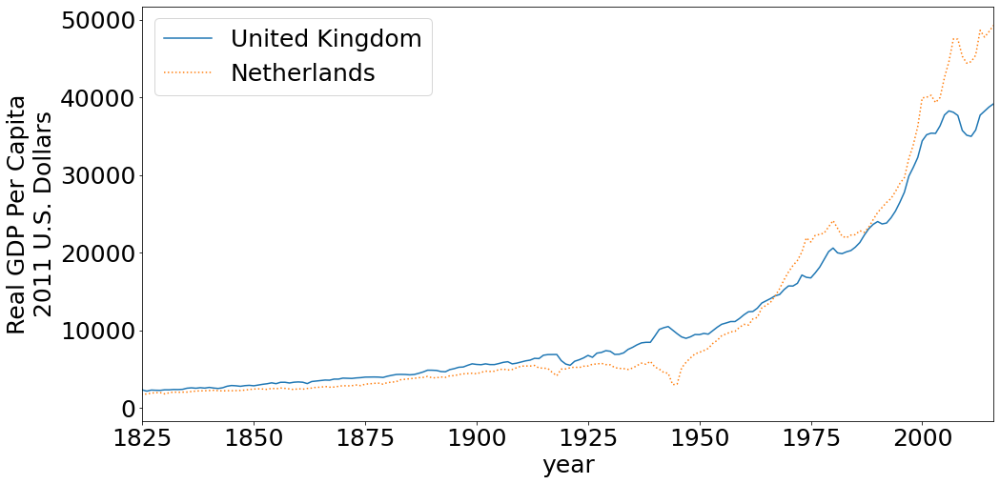

In [28]:
#multiIndex.py
# . . .
# pairs of countries to compare in plots
pairs = [("CAN", "FIN"), ("FRA", "DEU"), ("GBR", "NLD")]
linestyles = ["-", ":"]

plt.rcParams.update({"font.size": 25})
for pair in pairs:
    fig, ax = plt.subplots(figsize= (16, 8))
    for i in range(len(pair)):
        country_code = pair[i]
        # gather country name associated with country_code
        country_name = data.loc[country_code,2000]["country"]
        linestyle = linestyles[i]
        # plot country, and all dataes (:)
        data.loc[country_code, :]["cgdppc"].dropna(
            ).plot.line(ax = ax, label = country_name,
                       linestyle = linestyle)
    plt.xlim([1825, max(years)])
    plt.ylabel("Real GDP Per Capita\n2011 U.S. Dollars")
    plt.legend()
    plt.show()
    plt.close()

defines fraser data and imports pandas as pd as well as displaying the data

In [31]:
#dataForPanel.py
import pandas as pd

# make sure dates are imported in the same format; to do this,
# we turn off parse dates
fraser_data = pd.read_excel(
    "efw-2019-master-index-data-for-researchers.xlsx",
    sheet_name = "EFW Panel Data 2019 Report",
    header = [2],  index_col = [2,1], parse_dates = False)
fraser_data = fraser_data.dropna(
    axis = 0, thresh = 1).dropna(axis = 1, thresh = 1)
fraser_data

Countries       EFW  1  Size of Government  \
ISO_Code Year                                              
ALB      2017   Albania  7.673511               7.528167   
         2016   Albania  7.637742               7.875862   
         2015   Albania  7.639666               7.904257   
         2014   Albania  7.586769               7.882037   
         2013   Albania  7.389525               7.807904   
         2012   Albania  7.332332               8.096375   
         2011   Albania  7.381064               7.820966   
         2010   Albania  7.380725               7.839664   
         2009   Albania  7.313856               7.785948   
         2008   Albania  7.276252               8.189874   
         2007   Albania  7.258078               8.633510   
         2006   Albania  7.148669               8.039787   
         2005   Albania  6.985649               8.031015   
         2004   Albania  6.858749               7.397515   
         2003   Albania  7.031750               7.832298   
         2002   Albania  6.516060               7.700479   
         2001   Albania  6.322281               7.272991   
         2000   Albania  6.296170               7.260723   
         1995   Albania  5.041307               6.222428   
         1990   Albania  4.347428               3.338928   
         1985   Albania       NaN                    NaN   
         1980   Albania       NaN                    NaN   
         1975   Albania       NaN                    NaN   
         1970   Albania       NaN                    NaN   
DZA      2017   Algeria  4.763472               3.577033   
         2016   Algeria  5.030748               3.716934   
         2015   Algeria  4.794132               3.200157   
         2014   Algeria  5.136326               3.983687   
         2013   Algeria  5.167820               4.035976   
         2012   Algeria  5.003921               3.453623   
...                 ...       ...                    ...   
ZMB      1995    Zambia  4.418360               5.895636   
         1990    Zambia  2.870869               3.638100   
         1985    Zambia  3.286548               2.885189   
         1980    Zambia  4.269533               2.345607   
         1975    Zambia  3.709106               2.288363   
         1970    Zambia       NaN                    NaN   
ZWE      2017  Zimbabwe  5.699539               5.491676   
         2016  Zimbabwe  6.033204               5.926764   
         2015  Zimbabwe  6.145330               6.402772   
         2014  Zimbabwe  5.582478               6.433165   
         2013  Zimbabwe  5.246723               6.325105   
         2012  Zimbabwe  4.971192               6.670469   
         2011  Zimbabwe  4.843441               6.424630   
         2010  Zimbabwe  4.374917               6.514112   
         2009  Zimbabwe  4.314332               7.369615   
         2008  Zimbabwe  4.491870               7.070748   
         2007  Zimbabwe  3.204629               5.970748   
         2006  Zimbabwe  3.012548               4.770748   
         2005  Zimbabwe  2.889240               4.291101   
         2004  Zimbabwe  3.181057               5.184469   
         2003  Zimbabwe  3.675260               5.709175   
         2002  Zimbabwe  3.625483               5.514469   
         2001  Zimbabwe  3.633489               5.547411   
         2000  Zimbabwe  4.299839               5.365058   
         1995  Zimbabwe  5.518614               6.418859   
         1990  Zimbabwe  4.516140               5.108843   
         1985  Zimbabwe  4.226841               5.026250   
         1980  Zimbabwe  4.054740               6.322625   
         1975  Zimbabwe       NaN                    NaN   
         1970  Zimbabwe       NaN                    NaN   

               2  Legal System & Property Rights  3  Sound Money  \
ISO_Code Year                                                      
ALB      2017                           5.064907        9.648271   
         2016                

defines maddison data as data and displays it

In [32]:
maddison_data = data
fraser_data["RGDP Per Capita"] = maddison_data["cgdppc"]
fraser_data

Countries       EFW  1  Size of Government  \
ISO_Code Year                                              
ALB      2017   Albania  7.673511               7.528167   
         2016   Albania  7.637742               7.875862   
         2015   Albania  7.639666               7.904257   
         2014   Albania  7.586769               7.882037   
         2013   Albania  7.389525               7.807904   
         2012   Albania  7.332332               8.096375   
         2011   Albania  7.381064               7.820966   
         2010   Albania  7.380725               7.839664   
         2009   Albania  7.313856               7.785948   
         2008   Albania  7.276252               8.189874   
         2007   Albania  7.258078               8.633510   
         2006   Albania  7.148669               8.039787   
         2005   Albania  6.985649               8.031015   
         2004   Albania  6.858749               7.397515   
         2003   Albania  7.031750               7.832298   
         2002   Albania  6.516060               7.700479   
         2001   Albania  6.322281               7.272991   
         2000   Albania  6.296170               7.260723   
         1995   Albania  5.041307               6.222428   
         1990   Albania  4.347428               3.338928   
         1985   Albania       NaN                    NaN   
         1980   Albania       NaN                    NaN   
         1975   Albania       NaN                    NaN   
         1970   Albania       NaN                    NaN   
DZA      2017   Algeria  4.763472               3.577033   
         2016   Algeria  5.030748               3.716934   
         2015   Algeria  4.794132               3.200157   
         2014   Algeria  5.136326               3.983687   
         2013   Algeria  5.167820               4.035976   
         2012   Algeria  5.003921               3.453623   
...                 ...       ...                    ...   
ZMB      1995    Zambia  4.418360               5.895636   
         1990    Zambia  2.870869               3.638100   
         1985    Zambia  3.286548               2.885189   
         1980    Zambia  4.269533               2.345607   
         1975    Zambia  3.709106               2.288363   
         1970    Zambia       NaN                    NaN   
ZWE      2017  Zimbabwe  5.699539               5.491676   
         2016  Zimbabwe  6.033204               5.926764   
         2015  Zimbabwe  6.145330               6.402772   
         2014  Zimbabwe  5.582478               6.433165   
         2013  Zimbabwe  5.246723               6.325105   
         2012  Zimbabwe  4.971192               6.670469   
         2011  Zimbabwe  4.843441               6.424630   
         2010  Zimbabwe  4.374917               6.514112   
         2009  Zimbabwe  4.314332               7.369615   
         2008  Zimbabwe  4.491870               7.070748   
         2007  Zimbabwe  3.204629               5.970748   
         2006  Zimbabwe  3.012548               4.770748   
         2005  Zimbabwe  2.889240               4.291101   
         2004  Zimbabwe  3.181057               5.184469   
         2003  Zimbabwe  3.675260               5.709175   
         2002  Zimbabwe  3.625483               5.514469   
         2001  Zimbabwe  3.633489               5.547411   
         2000  Zimbabwe  4.299839               5.365058   
         1995  Zimbabwe  5.518614               6.418859   
         1990  Zimbabwe  4.516140               5.108843   
         1985  Zimbabwe  4.226841               5.026250   
         1980  Zimbabwe  4.054740               6.322625   
         1975  Zimbabwe       NaN                    NaN   
         1970  Zimbabwe       NaN                    NaN   

               2  Legal System & Property Rights  3  Sound Money  \
ISO_Code Year                                                      
ALB      2017                           5.064907        9.648271   
         2016                

In [33]:
fraser_data.to_csv("fraserDataWithRGDPPC.csv")

defines a function and tells the program to mark all countries that are from north america 

In [34]:
#indicatorVariable.py
def create_indicator_variable(data, indicator_name,
                              index_name, target_index_list):
    data[indicator_name] = 0
    # for each index whose name matches an entry in 
    # target_index_list a value of 1 will be recorded
    for index in target_index_list:
        data.loc[data.index.get_level_values(
            index_name) == index, [indicator_name]] = 1 
        
data = pd.read_csv("fraserDataWithRGDPPC.csv",
                  index_col = ["ISO_Code", "Year"],
                  parse_dates = True)

# select "ISO_Code" from names of double index
index_name = data.index.names[0]
indicator_name = "North America"

# select ISO_codes that will be marked 1 since they are
# in north america
countries_in_north_america = [
    "BHS", "BRB", "BLZ", "CAN", "CRI", "DOM", "SLV",
    "GTM", "HTI", "HND", "JAM", "MEX", "NIC", "PAN",
    "TTO", "USA"]  
        
create_indicator_variable(data = data,
                indicator_name = indicator_name,
                index_name = index_name,
                target_index_list = countries_in_north_america)
        
        
        
data

Countries       EFW  1  Size of Government  \
ISO_Code Year                                                    
ALB      2017-01-01   Albania  7.673511               7.528167   
         2016-01-01   Albania  7.637742               7.875862   
         2015-01-01   Albania  7.639666               7.904257   
         2014-01-01   Albania  7.586769               7.882037   
         2013-01-01   Albania  7.389525               7.807904   
         2012-01-01   Albania  7.332332               8.096375   
         2011-01-01   Albania  7.381064               7.820966   
         2010-01-01   Albania  7.380725               7.839664   
         2009-01-01   Albania  7.313856               7.785948   
         2008-01-01   Albania  7.276252               8.189874   
         2007-01-01   Albania  7.258078               8.633510   
         2006-01-01   Albania  7.148669               8.039787   
         2005-01-01   Albania  6.985649               8.031015   
         2004-01-01   Albania  6.858749               7.397515   
         2003-01-01   Albania  7.031750               7.832298   
         2002-01-01   Albania  6.516060               7.700479   
         2001-01-01   Albania  6.322281               7.272991   
         2000-01-01   Albania  6.296170               7.260723   
         1995-01-01   Albania  5.041307               6.222428   
         1990-01-01   Albania  4.347428               3.338928   
         1985-01-01   Albania       NaN                    NaN   
         1980-01-01   Albania       NaN                    NaN   
         1975-01-01   Albania       NaN                    NaN   
         1970-01-01   Albania       NaN                    NaN   
DZA      2017-01-01   Algeria  4.763472               3.577033   
         2016-01-01   Algeria  5.030748               3.716934   
         2015-01-01   Algeria  4.794132               3.200157   
         2014-01-01   Algeria  5.136326               3.983687   
         2013-01-01   Algeria  5.167820               4.035976   
         2012-01-01   Algeria  5.003921               3.453623   
...                       ...       ...                    ...   
ZMB      1995-01-01    Zambia  4.418360               5.895636   
         1990-01-01    Zambia  2.870869               3.638100   
         1985-01-01    Zambia  3.286548               2.885189   
         1980-01-01    Zambia  4.269533               2.345607   
         1975-01-01    Zambia  3.709106               2.288363   
         1970-01-01    Zambia       NaN                    NaN   
ZWE      2017-01-01  Zimbabwe  5.699539               5.491676   
         2016-01-01  Zimbabwe  6.033204               5.926764   
         2015-01-01  Zimbabwe  6.145330               6.402772   
         2014-01-01  Zimbabwe  5.582478               6.433165   
         2013-01-01  Zimbabwe  5.246723               6.325105   
         2012-01-01  Zimbabwe  4.971192               6.670469   
         2011-01-01  Zimbabwe  4.843441               6.424630   
         2010-01-01  Zimbabwe  4.374917               6.514112   
         2009-01-01  Zimbabwe  4.314332               7.369615   
         2008-01-01  Zimbabwe  4.491870               7.070748   
         2007-01-01  Zimbabwe  3.204629               5.970748   
         2006-01-01  Zimbabwe  3.012548               4.770748   
         2005-01-01  Zimbabwe  2.889240               4.291101   
         2004-01-01  Zimbabwe  3.181057               5.184469   
         2003-01-01  Zimbabwe  3.675260               5.709175   
         2002-01-01  Zimbabwe  3.625483               5.514469   
         2001-01-01  Zimbabwe  3.633489               5.547411   
         2000-01-01  Zimbabwe  4.299839               5.365058   
         1995-01-01  Zimbabwe  5.518614               6.418859   
         1990-01-01  Zimbabwe  4.516140               5.108843   
         1985-01-01  Zimbabwe  4.226841               5.026250   
         1980-01-01  Zimbabwe  4.054740               6.3226

displays data on the USA and Mexico

In [35]:
data.loc[["USA", "MEX"]]

Countries       EFW  1  Size of Government  \
ISO_Code Year                                                         
MEX      2017-01-01         Mexico  6.924638               7.899794   
         2016-01-01         Mexico  6.765401               7.596662   
         2015-01-01         Mexico  6.870605               7.565521   
         2014-01-01         Mexico  6.830050               7.570566   
         2013-01-01         Mexico  6.741077               6.790522   
         2012-01-01         Mexico  6.648044               6.694787   
         2011-01-01         Mexico  6.641699               6.719835   
         2010-01-01         Mexico  6.661801               6.846833   
         2009-01-01         Mexico  6.537502               6.491682   
         2008-01-01         Mexico  6.650639               6.811386   
         2007-01-01         Mexico  6.754750               7.283262   
         2006-01-01         Mexico  6.850885               7.009304   
         2005-01-01         Mexico  6.813623               7.027833   
         2004-01-01         Mexico  6.745819               7.206985   
         2003-01-01         Mexico  6.664144               7.177719   
         2002-01-01         Mexico  6.664172               7.232296   
         2001-01-01         Mexico  6.480747               7.243421   
         2000-01-01         Mexico  6.512623               7.108165   
         1995-01-01         Mexico  6.419693               6.948741   
         1990-01-01         Mexico  6.115854               7.404417   
         1985-01-01         Mexico  4.605876               5.751582   
         1980-01-01         Mexico  5.117640               5.291239   
         1975-01-01         Mexico  5.748692               5.654648   
         1970-01-01         Mexico  6.430644               6.688071   
USA      2017-01-01  United States  8.196365               7.157599   
         2016-01-01  United States  8.183442               7.138582   
         2015-01-01  United States  8.085664               7.121655   
         2014-01-01  United States  7.969703               7.126057   
         2013-01-01  United States  7.900998               7.097752   
         2012-01-01  United States  8.012288               7.565472   
         2011-01-01  United States  7.906265               7.260760   
         2010-01-01  United States  7.972577               7.108888   
         2009-01-01  United States  7.965853               7.147290   
         2008-01-01  United States  8.244885               7.496386   
         2007-01-01  United States  8.394524               7.790872   
         2006-01-01  United States  8.318497               7.701156   
         2005-01-01  United States  8.353783               7.706034   
         2004-01-01  United States  8.443225               7.717933   
         2003-01-01  United States  8.454976               7.830378   
         2002-01-01  United States  8.457409               7.642580   
         2001-01-01  United States  8.410677               7.429561   
         2000-01-01  United States  8.518073               7.376862   
         1995-01-01  United States  8.341947               7.212638   
         1990-01-01  United States  8.243760               7.297623   
         1985-01-01  United States  7.953914               6.227951   
         1980-01-01  United States  7.770014               5.327910   
         1975-01-01  United States  7.586137               5.237192   
         1970-01-01  United States  7.450927               5.428116   

                     2  Legal System & Property Rights  3  Sound Money  \
ISO_Code Year                                                            
MEX      2017-01-01                           4.184890        7.891374   
         2016-01-01                           4.127169        8.106595   
         2015-01-01                           4.222496        8.150229   
         2014-01-01                           4.237656        8.062198   
         2013-01-01           